In [1]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn import metrics

In [2]:
Y_trainfull = pd.read_csv('./csv/training_solutions_rev1.csv', index_col=0)

In [3]:
rounded = Y_trainfull.sort_values(by='Class1.1')[-100:]
rounded

,Class1.1,Class1.2,Class1.3,Class2.1,Class2.2,Class3.1,Class3.2,Class4.1,Class4.2,Class5.1,...,Class9.3,Class10.1,Class10.2,Class10.3,Class11.1,Class11.2,Class11.3,Class11.4,Class11.5,Class11.6
GalaxyID,,,,,,,,,,,,,,,,,,,,,
738475,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
203026,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
851273,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
975075,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
287142,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
697454,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
187245,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
480384,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
disks = Y_trainfull.sort_values(by='Class1.2')[-100:]
disks

,Class1.1,Class1.2,Class1.3,Class2.1,Class2.2,Class3.1,Class3.2,Class4.1,Class4.2,Class5.1,...,Class9.3,Class10.1,Class10.2,Class10.3,Class11.1,Class11.2,Class11.3,Class11.4,Class11.5,Class11.6
GalaxyID,,,,,,,,,,,,,,,,,,,,,
521311,0.0,1.0,0.0,0.027196,0.972804,0.972804,0.000000,0.972804,0.000000,0.190444,...,0.000000,0.154636,0.510076,0.308092,0.000000,0.972804,0.000000,0.000000,0.000000,0.000000
392544,0.0,1.0,0.0,0.000000,1.000000,0.236727,0.763273,1.000000,0.000000,0.000000,...,0.000000,0.676000,0.324000,0.000000,0.000000,0.059059,0.088088,0.235235,0.176176,0.441441
396981,0.0,1.0,0.0,0.102970,0.897030,0.835815,0.061215,0.897030,0.000000,0.073557,...,0.041188,0.777118,0.119912,0.000000,0.000000,0.811131,0.016433,0.000000,0.000000,0.069466
265087,0.0,1.0,0.0,0.000000,1.000000,0.283966,0.716034,0.839977,0.160023,0.000000,...,0.000000,0.096371,0.346924,0.396682,0.022646,0.817331,0.000000,0.000000,0.000000,0.000000
265480,0.0,1.0,0.0,0.033760,0.966240,0.819858,0.146382,0.888341,0.077899,0.020759,...,0.000000,0.000000,0.470546,0.417795,0.000000,0.841276,0.000000,0.047064,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
896711,0.0,1.0,0.0,0.027217,0.972783,0.972783,0.000000,0.972783,0.000000,0.000000,...,0.000000,0.061982,0.553923,0.356878,0.000000,0.972783,0.000000,0.000000,0.000000,0.000000
896826,0.0,1.0,0.0,0.000000,1.000000,0.515620,0.484380,1.000000,0.000000,0.519664,...,0.000000,0.038000,0.577000,0.385000,0.037975,0.910729,0.000000,0.000000,0.000000,0.051296
916109,0.0,1.0,0.0,0.015800,0.984200,0.050930,0.933270,0.984200,0.000000,0.017640,...,0.000000,0.765435,0.218765,0.000000,0.000000,0.247928,0.458679,0.115127,0.023947,0.138521


In [5]:
no_galaxy = Y_trainfull.sort_values(by='Class1.3')[-50:]
no_galaxy

,Class1.1,Class1.2,Class1.3,Class2.1,Class2.2,Class3.1,Class3.2,Class4.1,Class4.2,Class5.1,...,Class9.3,Class10.1,Class10.2,Class10.3,Class11.1,Class11.2,Class11.3,Class11.4,Class11.5,Class11.6
GalaxyID,,,,,,,,,,,,,,,,,,,,,
202788,0.242413,0.290022,0.467565,0.000000,0.290022,0.068764,0.221258,0.290022,0.000000,0.000000,...,0.000000,0.126857,0.163165,0.000000,0.000000,0.068731,0.0,0.0,0.0,0.221291
522875,0.488000,0.044000,0.468000,0.000000,0.044000,0.000000,0.044000,0.000000,0.044000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000
700251,0.481518,0.043956,0.474525,0.000000,0.043956,0.000000,0.043956,0.000000,0.043956,0.021978,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000
435080,0.497502,0.026973,0.475524,0.000000,0.026973,0.000000,0.026973,0.000000,0.026973,0.003965,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000
689434,0.400000,0.111000,0.489000,0.022200,0.088800,0.000000,0.088800,0.000000,0.088800,0.066600,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000
284451,0.287022,0.221976,0.491003,0.000000,0.221976,0.000000,0.221976,0.000000,0.221976,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000
376334,0.473000,0.022000,0.505000,0.000000,0.022000,0.000000,0.022000,0.000000,0.022000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000
847440,0.444444,0.044044,0.511512,0.000000,0.044044,0.000000,0.044044,0.022022,0.022022,0.000000,...,0.000000,0.022022,0.000000,0.000000,0.000000,0.022022,0.0,0.0,0.0,0.000000
858943,0.269049,0.214574,0.516376,0.000000,0.214574,0.000000,0.214574,0.143155,0.071419,0.097440,...,0.000000,0.143155,0.000000,0.000000,0.000000,0.143155,0.0,0.0,0.0,0.000000


In [10]:
cv2.imread('../../../images_training_rev1/356310.jpg').shape

(424, 424, 3)

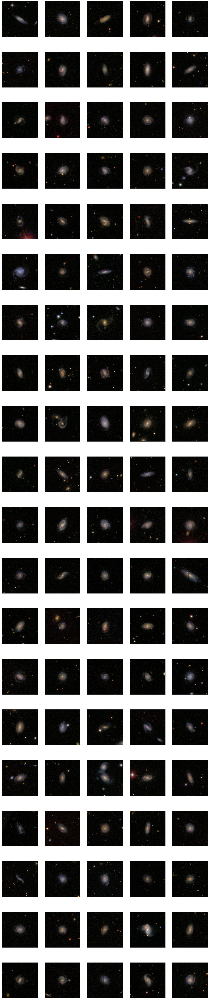

In [11]:
i = 1
plt.figure(figsize=(20,100))
for disk_id in disks.index:
    image = cv2.imread('../../../images_training_rev1/' + str(disk_id) + '.jpg')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.subplot(20, 5, i)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    i += 1

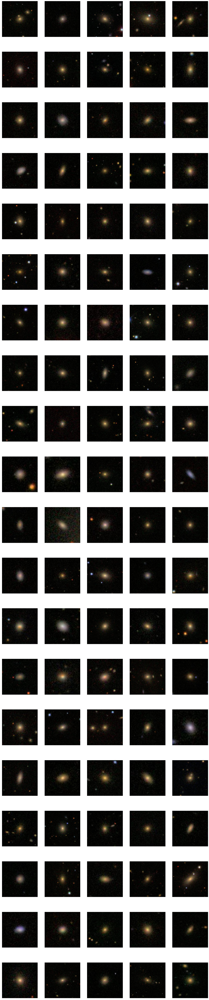

In [14]:
i = 1
plt.figure(figsize=(20,100))
for disk_id in rounded.index:
    image = cv2.imread('../../../images_training_rev1/' + str(disk_id) + '.jpg')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.subplot(20, 5, i)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    i += 1

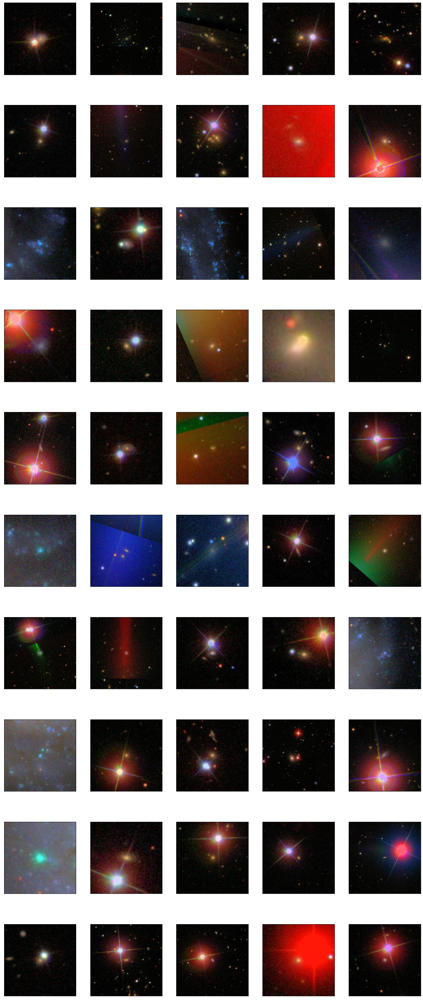

In [16]:
i = 1
plt.figure(figsize=(20,100))
for disk_id in no_galaxy.index:
    image = cv2.imread('../../../images_training_rev1/' + str(disk_id) + '.jpg')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.subplot(20, 5, i)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    i += 1

In [17]:
Y_trainfull = Y_trainfull.iloc[:, 0:3]

In [18]:
Y_trainfull.loc[Y_trainfull['Class1.1'] == Y_trainfull.iloc[:,0:3].agg(func=max, axis=1), 'shape'] = 'Class1.1'

In [19]:
Y_trainfull.loc[Y_trainfull['Class1.2'] == Y_trainfull.iloc[:,0:3].agg(func=max, axis=1), 'shape'] = 'Class1.2'

In [20]:
Y_trainfull.loc[Y_trainfull['Class1.3'] == Y_trainfull.iloc[:,0:3].agg(func=max, axis=1), 'shape'] = 'Class1.3'

In [21]:
Y_trainfull['shape'].value_counts()

Class1.2    34839
Class1.1    26679
Class1.3       60
Name: shape, dtype: int64

In [22]:
Y_trainfull = pd.get_dummies(Y_trainfull)

In [23]:
Y_trainfull = Y_trainfull.iloc[:, 3:6]
#Y_trainfull.columns[0] = 'other name'

In [24]:
Y_trainfull

,shape_Class1.1,shape_Class1.2,shape_Class1.3
GalaxyID,,,
100008,0,1,0
100023,0,1,0
100053,1,0,0
100078,1,0,0
100090,1,0,0
...,...,...,...
999948,1,0,0
999950,1,0,0
999958,0,1,0


In [25]:
baseline_0 = Y_trainfull.copy()
baseline_0.iloc[:, :] = 0
baseline_0

,shape_Class1.1,shape_Class1.2,shape_Class1.3
GalaxyID,,,
100008,0,0,0
100023,0,0,0
100053,0,0,0
100078,0,0,0
100090,0,0,0
...,...,...,...
999948,0,0,0
999950,0,0,0
999958,0,0,0


In [26]:
metrics.confusion_matrix(Y_trainfull.values, baseline_0.values)

ValueError: multilabel-indicator is not supported

In [27]:
img = cv2.imread('../../../images_training_rev1/100023.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_grey = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

ret, thresh = cv2.threshold(img_grey, thresh=40, maxval=255, type=0)
contours, hierarchy = cv2.findContours(thresh, 1, 2)

max_numb = 0
for contour in contours:
    if len(contour) > max_numb:
        max_numb = len(contour)
        cnt = contour

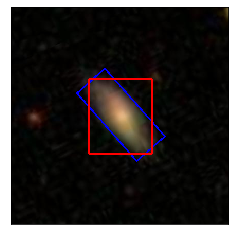

In [28]:
rect = cv2.minAreaRect(cnt)
box = cv2.boxPoints(rect)
box = np.int0(box)
cv2.drawContours(img, [box], 0, (0, 0, 255), 2)

x,y,w,h = cv2.boundingRect(cnt)
cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)

plt.imshow(img)
plt.xticks([])
plt.yticks([]);

(145, 123, 3)


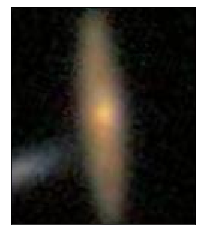

In [29]:
img = cv2.cvtColor(cv2.imread('../../../images_training_rev1/100143.jpg'), cv2.COLOR_BGR2RGB)
img_crop = img[y:y+h, x:x+w]
plt.imshow(img_crop);
plt.xticks([])
plt.yticks([])
print(img_crop.shape)

In [30]:
box

array([[244, 301],
       [128, 169],
       [182, 121],
       [299, 253]])